In [ ]:
#clone YOLOv5 and 
!git clone https://github.com/ultralytics/yolov5  # clone repo
%cd yolov5
%pip install -qr requirements.txt # install dependencies
#%pip install -q roboflow

import torch
import os
from IPython.display import Image, clear_output  # to display images

print(f"Setup complete. Using torch {torch.__version__} ({torch.cuda.get_device_properties(0).name if torch.cuda.is_available() else 'CPU'})")

Cloning into 'yolov5'...
remote: Enumerating objects: 13162, done.
remote: Counting objects: 100% (43/43), done.
remote: Compressing objects: 100% (30/30), done.
remote: Total 13162 (delta 23), reused 26 (delta 13), pack-reused 13119
Receiving objects: 100% (13162/13162), 12.52 MiB | 32.47 MiB/s, done.
Resolving deltas: 100% (9035/9035), done.
/content/yolov5/yolov5
Setup complete. Using torch 1.12.0+cu113 (Tesla P100-PCIE-16GB)


In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [ ]:
#!unzip "/content/gdrive/MyDrive/ml/Modern_Computer_Vision/website_image/Website Elements.v3-augmented5x-roboflow-accurate-model.yolov5pytorch.zip" -d "/content/gdrive/MyDrive/ml/Modern_Computer_Vision/website_image/Website_Elements/"
#!unzip -o '/content/gdrive/MyDrive/ml/Modern_Computer_Vision/pistols.zip'

Streaming output truncated to the last 5000 lines.
 extracting: /content/gdrive/MyDrive/ml/Modern_Computer_Vision/website_image/Website_Elements/train/labels/WIN_20210916_12_29_09_Pro_mp4-140_jpg.rf.d8036d9e0c44db2da351759e07b8e485.txt  
 extracting: /content/gdrive/MyDrive/ml/Modern_Computer_Vision/website_image/Website_Elements/train/labels/WIN_20210916_12_29_09_Pro_mp4-140_jpg.rf.dffa9d5962900b68ef0d225bd4a06c0d.txt  
 extracting: /content/gdrive/MyDrive/ml/Modern_Computer_Vision/website_image/Website_Elements/train/labels/WIN_20210916_12_29_09_Pro_mp4-140_jpg.rf.e983fcd93c07d7b0d4e49c9190360db3.txt  
 extracting: /content/gdrive/MyDrive/ml/Modern_Computer_Vision/website_image/Website_Elements/train/labels/WIN_20210916_12_29_09_Pro_mp4-140_jpg.rf.f7e281175f02f3c7e9b6f2dfab8dd484.txt  
 extracting: /content/gdrive/MyDrive/ml/Modern_Computer_Vision/website_image/Website_Elements/train/labels/WIN_20210916_12_29_09_Pro_mp4-140_jpg.rf.fc4306d1beec964f9b3373f4e2ef2eae.txt  
 extracting: /

# Step 3: Train Our Custom YOLOv5 model

Here, we are able to pass a number of arguments:
- **img:** define input image size
- **batch:** determine batch size
- **epochs:** define the number of training epochs. (Note: often, 3000+ are common here!)
- **data:** Our dataset locaiton is saved in the `dataset.location`
- **weights:** specify a path to weights to start transfer learning from. Here we choose the generic COCO pretrained checkpoint.
- **cache:** cache images for faster training

In [ ]:
%cd /content/yolov5
#!python train.py --img 416 --batch 16 --epochs 150 --data {dataset.location}/data.yaml --weights yolov5s.pt --cache
import os
# Print the current working directory
print("Current working directory: {0}".format(os.getcwd()))

#though due to the high amount of small objects in the dataset it can benefit from training at higher resolutions such as --img 1280. 
#!python train.py --img 640 --batch 32 --epochs 1000 --data /content/gdrive/MyDrive/ml/aeriel7/data.yaml --weights yolov5s.pt --cache

!python train.py --img 416  --batch 32 --epochs 100 --data /content/gdrive/MyDrive/ml/Modern_Computer_Vision/website_image/Website_Elements/data.yaml --weights yolov5s.pt --cache

/content/yolov5
Current working directory: /content/yolov5
train: weights=yolov5s.pt, cfg=, data=/content/gdrive/MyDrive/ml/Modern_Computer_Vision/website_image/Website_Elements/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=100, batch_size=32, imgsz=416, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=exp, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: skipping check (Docker image), for updates see https://github.com/ultralytics/yolov5
YOLOv5 🚀 v6.1-325-g3e85863 Python-3.7.13 torch-1.12.0+cu113 CUDA:0 (Tesla P100-PCIE-16GB, 16281MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_

In [ ]:
import shutil

#shutil.copyfile(src, dst)
src = '/content/yolov5/runs/train/exp4/weights/best.pt'
dst = '/content/gdrive/MyDrive/ml/Modern_Computer_Vision/website_image/'
# 2nd option
shutil.copy(src, dst)  # dst can be a folder; use shutil.copy2() to preserve timestamp

'/content/gdrive/MyDrive/ml/Modern_Computer_Vision/website_image/best.pt'

# Evaluate Custom YOLOv5 Detector Performance
Training losses and performance metrics are saved to Tensorboard and also to a logfile.

If you are new to these metrics, the one you want to focus on is `mAP_0.5` - learn more about mean average precision [here](https://blog.roboflow.com/mean-average-precision/).

In [ ]:
# Start tensorboard
# Launch after you have started training
# logs save in the folder "runs"
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

#Run Inference  With Trained Weights
Run inference with a pretrained checkpoint on contents of `test/images` folder downloaded from Roboflow.

In [ ]:

#!python detect.py --weights /content/yolov5/runs/train/exp2/weights/best.pt --img 640 --conf 0.1 --source /content/yolov5/test/images


!python detect.py --weights /content/yolov5/runs/train/exp4/weights/best.pt --img 416 --save-crop  --conf 0.6 --source /content/gdrive/MyDrive/ml/Modern_Computer_Vision/website_image/Website_Elements/test/images

detect: weights=['/content/yolov5/runs/train/exp4/weights/best.pt'], source=/content/gdrive/MyDrive/ml/Modern_Computer_Vision/website_image/Website_Elements/test/images, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.6, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=True, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.1-325-g3e85863 Python-3.7.13 torch-1.12.0+cu113 CUDA:0 (Tesla P100-PCIE-16GB, 16281MiB)

Fusing layers... 
Model summary: 213 layers, 7029004 parameters, 0 gradients, 15.8 GFLOPs
image 1/50 /content/gdrive/MyDrive/ml/Modern_Computer_Vision/website_image/Website_Elements/test/images/WIN_20210916_12_29_09_Pro_mp4-104_jpg.rf.0cc7cd3e3e059e1a40b274be9baeb064.jpg: 416x416 1 banner, 1 button, 1 form, 1 header, 1 logo, 1 long_paragraph, 1 sho

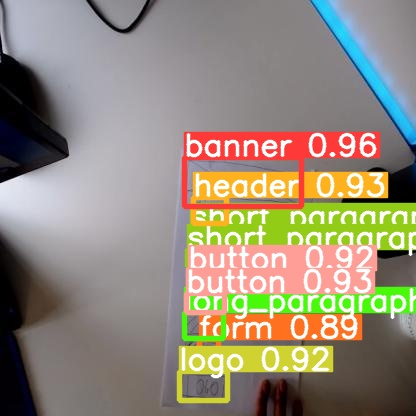

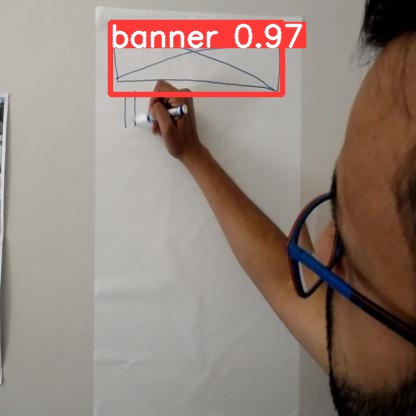

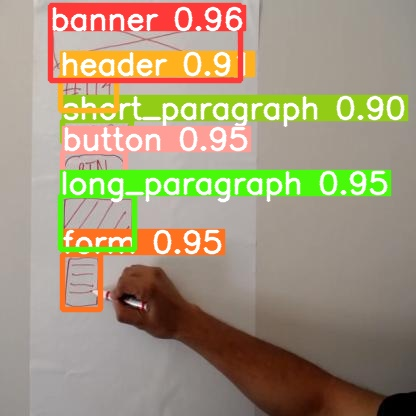

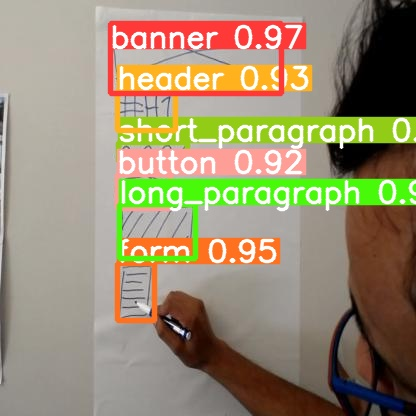

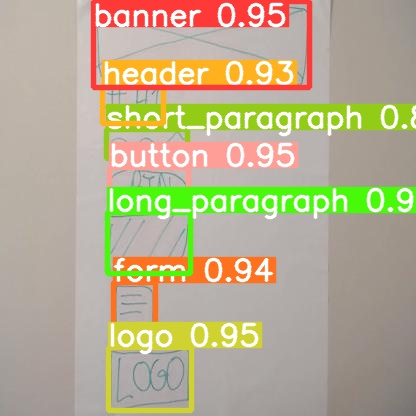

...

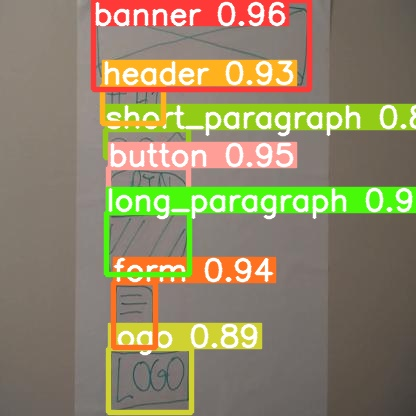

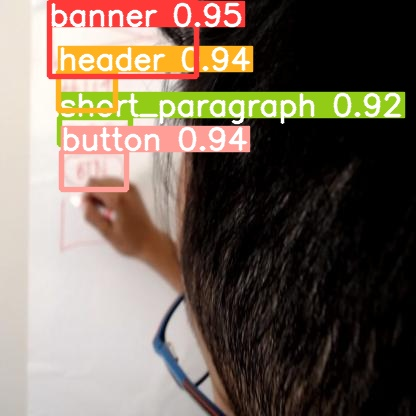

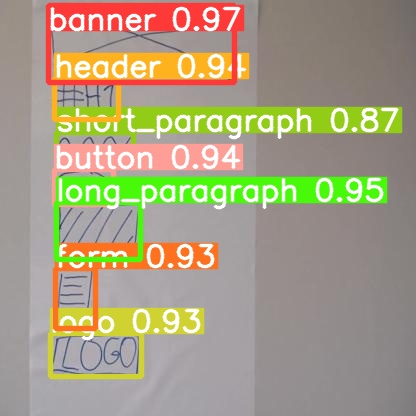

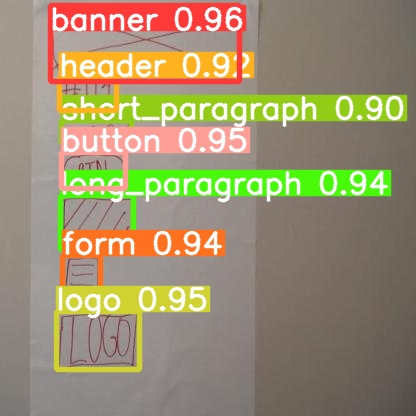

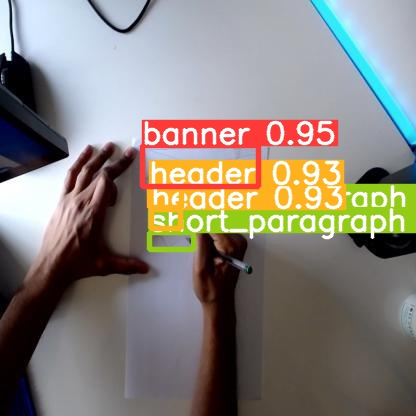

In [ ]:
#display inference on ALL test images

import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/yolov5/runs/detect/exp3/*.jpg'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")

# Conclusion and Next Steps

Congratulations! You've trained a custom YOLOv5 model to recognize your custom objects.

To improve you model's performance, we recommend first interating on your datasets coverage and quality. See this guide for [model performance improvement](https://github.com/ultralytics/yolov5/wiki/Tips-for-Best-Training-Results).

To deploy your model to an application, see this guide on [exporting your model to deployment destinations](https://github.com/ultralytics/yolov5/issues/251).

Once your model is in production, you will want to continually iterate and improve on your dataset and model via [active learning](https://blog.roboflow.com/what-is-active-learning/).

In [ ]:
#export your model's weights for future use
from google.colab import files
files.download('./runs/train/exp12/weights/best.pt')

FileNotFoundError: ignored